In [ ]:
mandelbrot = Mandelbrot()
num_points = 10000000
max_iter = np.array([3000])
grid, converges, escape_times = mandelbrot.get_escape_time(num_points, max_iter)
mandelbrot.get_MC(converges)

array([1.50599155])

In [ ]:
def has_no_converging_points(grid, converges, r, real_part):
    if real_part:
        condition = np.real(grid) > r
    else:
        condition = np.abs(np.imag(grid)) > r
    
    converging_points = np.logical_and(condition, converges)
    
    return not np.any(converging_points)

print(has_no_converging_points(grid, converges, 0.5, True))
has_no_converging_points(grid, converges, 1.10, False)

True


True

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter
from matplotlib.colors import LinearSegmentedColormap

def plot_Mandelbrot(grid, escape_times):
    sns.set(style='whitegrid')
    colors = ['#00008B', 'white', 'black']
    cmap = LinearSegmentedColormap.from_list('blue_white_black', colors)

    fig, ax = plt.subplots(figsize=(10, 10), dpi=500)

    # Set only the plot area background to blue
    ax.set_facecolor('#00008B')
    
    ax.scatter(np.real(grid), np.imag(grid), c=np.log(escape_times), cmap=cmap, s=0.01)
    ax.set_xlim([-2, 2])
    ax.set_ylim([-2, 2])

    def format_func(value, tick_number):
        return f'{value}i'

    ax.yaxis.set_major_formatter(FuncFormatter(format_func))

    ax.axvline(x=0.5, color='r', linestyle='--')
    ax.axhline(y=1.15, color='g', linestyle='--')
    ax.axhline(y=-1.15, color='b', linestyle='--')

    ax.set_xlabel('Re')
    ax.set_ylabel('Im')

    ax.set_title(f'Mandelbrot Set with {len(grid)} Uniform Points')
    ax.grid(False)

    plt.show()


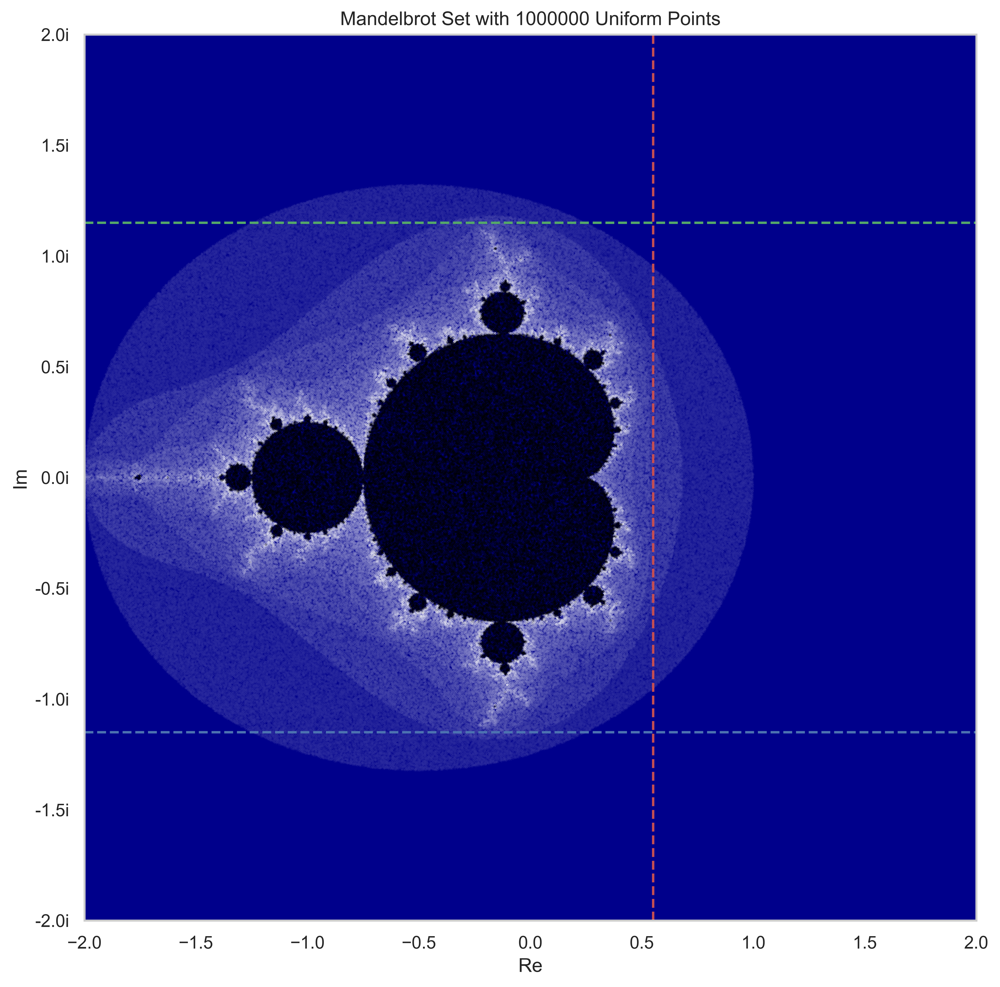

In [ ]:
plot_Mandelbrot(grid, escape_times)